### Загрузка данных

In [3]:
import plotly.graph_objects as go
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [4]:
df = pd.read_csv('../datasets/kaggle_survey_2022_responses.csv', low_memory=False) 
df.head(5)

,Duration (in seconds),Q2,Q3,Q4,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,...,Q44_3,Q44_4,Q44_5,Q44_6,Q44_7,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,"Are you currently a student? (high school, uni...",On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...
1,121,30-34,Man,India,No,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,462,30-34,Man,Algeria,No,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,293,18-21,Man,Egypt,Yes,Coursera,edX,NaN,DataCamp,NaN,...,NaN,"Kaggle (notebooks, forums, etc)",NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...","Podcasts (Chai Time Data Science, O’Reilly Dat...",NaN,NaN,NaN,NaN,NaN
4,851,55-59,Man,France,No,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,...,NaN,"Kaggle (notebooks, forums, etc)","Course Forums (forums.fast.ai, Coursera forums...",NaN,NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN


# 1

Строим круговую диаграмму (Pie plot) для возраста респондента.

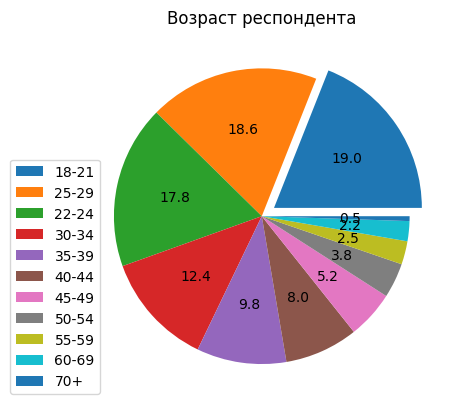

In [5]:
task1 = df['Q2']
task1 = task1.drop(0)
series = task1.value_counts()

age = series.index.tolist()
count = series.values.tolist()

# Сдвиг элементе пирога
exp = [0.1 if a == '18-21' else 0 for a in age]

# Построение круговой диаграммы
plt.pie(count, labels=['']*len(age), autopct='%.1f',explode=exp)

# Подпись диаграммы
plt.title("Возраст респондента")

# Добавление легенды с указанием позиции
plt.legend(age,loc='lower left', bbox_to_anchor=(-0.2, 0))

plt.show()

# 2

Строим столбцовую диаграмму (Bar plot) по популярности библиотек для визуализации.

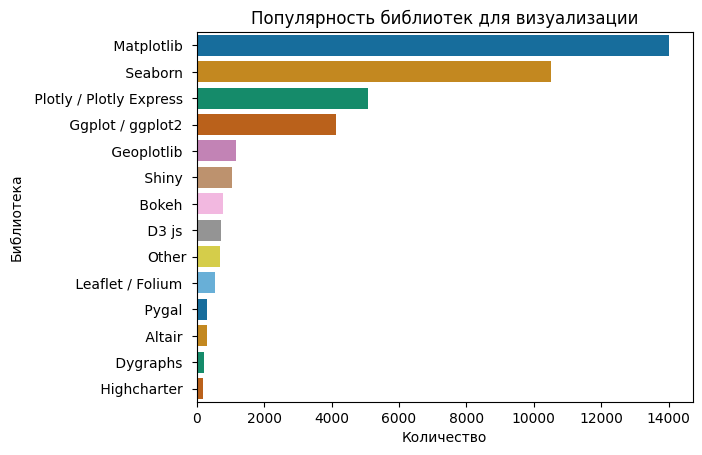

In [6]:
q15_columns = [col for col in df.columns if col.startswith('Q15')]
courses = df[q15_columns]
courses = courses.drop(0)
task2 = courses[q15_columns].melt(value_vars = q15_columns)
task2 = task2.dropna()
value_counts = task2['value'].value_counts()

# Создание столбцовой диаграммы с помощью seaborn
sns.barplot(x = value_counts.values, y = value_counts.index, palette ='colorblind')

# Добавление заголовка и подписей осей
plt.title('Популярность библиотек для визуализации')
plt.xlabel('Количество')
plt.ylabel('Библиотека')

plt.show()

# 3

Строим диаграмму "Ящик с усами" (Box plot) заработка по различным специальностям.

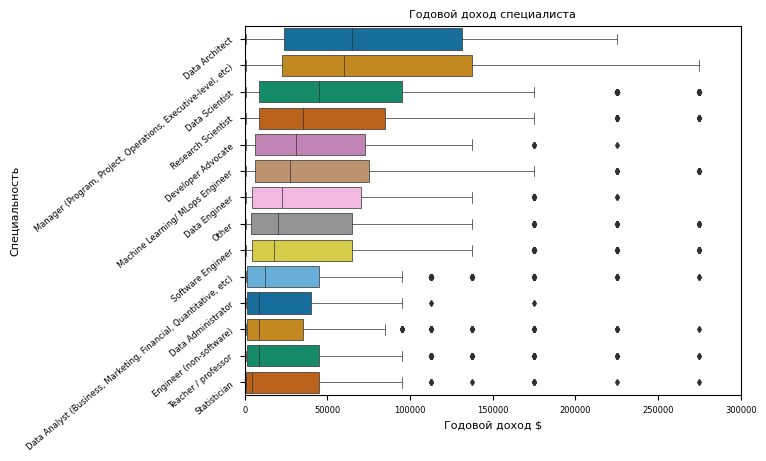

In [7]:
employees_mapping = {}
q29 = df ['Q29']
q29 = q29.drop (0)
for index, value in q29.items():
   if (type (value)) == str:
      if value == '>$1,000,000':
         range_start = 1000000
         employees_mapping[value] = range_start
      else:
         range_split = value.split('-')
         if len (range_split) == 2:
            range_start = int(range_split[0].replace(',', '').strip('$'))
            range_end = int(range_split[1].replace(',', ''))
            range_mean = round((range_start + range_end) / 2)
            employees_mapping[value] = range_mean

job_and_money = df[['Q23', 'Q29']].copy()
job_and_money = job_and_money.drop(0).dropna()
job_and_money['Q29-NEW'] = job_and_money['Q29'].map(employees_mapping)
job_and_money = job_and_money [['Q23', 'Q29-NEW']]
task3 = job_and_money.groupby(['Q23'])['Q29-NEW'].median().sort_values(ascending = False)

ax = sns.boxplot(
            y = job_and_money['Q23'], 
            x = job_and_money['Q29-NEW'], 
            palette = 'colorblind', 
            order = task3.index,
            linewidth = 0.5,
            fliersize = 3
            )

# Шаг измерения по оси х
plt.xlim(0, 300000)

# Наклон подписей по оси у
plt.yticks(rotation = 40)

# Размер шрифта по оси у
plt.yticks(fontsize = 6)
# Размер шрифта по оси х
plt.xticks(fontsize = 6)

plt.title('Годовой доход специалиста',fontsize = 8)
plt.xlabel('Годовой доход $',fontsize = 8)
plt.ylabel('Специальность',fontsize = 8)

plt.show()

# 4

Строим столбцовую диаграмму (Bar plot) на распределение респондентов по возрасту по специальностям.

In [8]:
from plotly.subplots import make_subplots

# Список для составления диаграмм
specialties = [
                'Data Administrator', 'Data Analyst (Business, Marketing, Financial, Quantitative, etc)',
                'Data Engineer', 'Data Scientist', 'Engineer (non-software)',
               'Machine Learning/ MLops Engineer', 'Research Scientist', 'Software Engineer', 'Data Architect'
               ]

name_subgraf = [
                'Data Administrator', 'Data Analyst', 'Data Engineer', 'Data Scientist', 'Engineer',
               'MLops Engineer', 'Research Scientist', 'Software Engineer', 'Data Architect'
               ]

# Создание субграфиков с 3 рядами и 3 колонками
fig = make_subplots(rows = 3, cols = 3, subplot_titles = name_subgraf)

# Задаем размер субгпафикам
fig.update_layout(height = 600, width = 800)

fig.update_layout(title = "Распределение респондентов по возрасту по специальностям" )

# Итерация по специальностям
for i, specialty in enumerate(specialties):
    # Формирование таблицы для текущей специальности
    ages_specialties = df[df['Q23'] == specialty]['Q2'].value_counts().sort_index()
    # Добавление таблицы
    fig.add_trace(
                go.Bar(x = ages_specialties.index, y = ages_specialties.values,name = name_subgraf [i]),
                row = (i // 3) + 1,
                col = (i % 3) + 1
                )

# Вывод диаграмы
fig.show()

# 5

Строим карту стран респондентов. 

In [9]:
import plotly.express as px

cantry = df['Q4'].drop(0)
cantry_counts = cantry.value_counts().reset_index()
cantry_counts.columns = ['country', 'Количество респондентов']

fig = px.choropleth(
                    data_frame = cantry_counts,
                    locations = 'country',
                    locationmode ='country names',
                    color ='Количество респондентов',
                    color_continuous_scale ='Viridis',
                    range_color = (0, 1000)
                    )
                   
fig.update_layout(
                    title = {'text': "Карта Мира",'x': 0.5, 'y': 0.95},
                    geo = dict(showframe = True, showcoastlines = True),
                    coloraxis_colorbar=dict(len = 1.5, x = 0.80, ticks = 'outside')
                )

fig.show()

# 6

Выводим gif изображение популярности библиотек для визуализации в разных странах.

d:\PYTHON\lib\site-packages\bar_chart_race\_make_chart.py:286: UserWarning:

FixedFormatter should only be used together with FixedLocator

d:\PYTHON\lib\site-packages\bar_chart_race\_make_chart.py:287: UserWarning:

FixedFormatter should only be used together with FixedLocator

MovieWriter imagemagick unavailable; using Pillow instead.


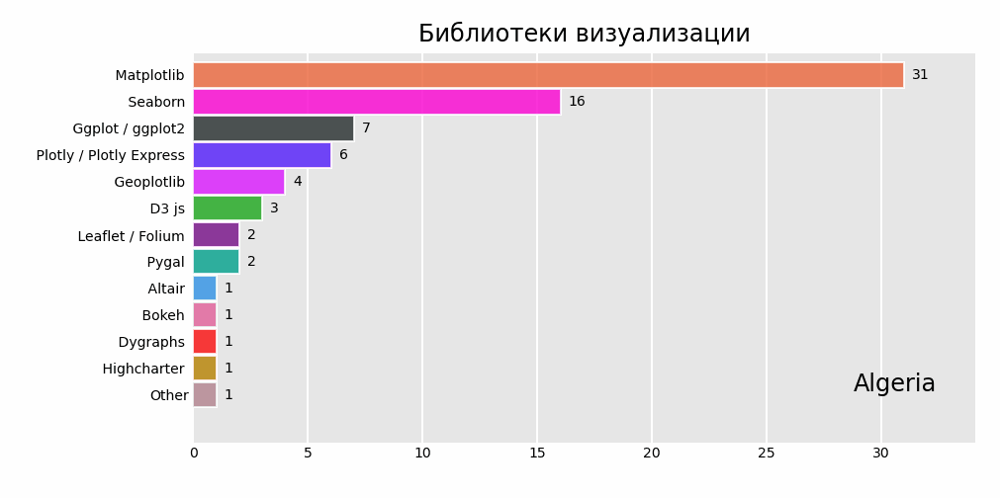

In [10]:
import bar_chart_race as bcr
from IPython.display import Image

# Извлечение столбцов 'Q4' и столбцов, начинающихся с 'Q15' из DataFrame
biblio = df.loc[:, ['Q4'] + ['Q15_' + str(i) for i in range(1, 16)]].drop(0)

# Получение списка столбцов, начинающихся с 'Q15'
q15_columns = [col for col in biblio.columns if col.startswith('Q15')]

# Преобразование DataFrame в длинный формат, удаляя нулевые значения
cantry_biblio = biblio.melt(id_vars=['Q4'], value_vars=q15_columns, var_name='column', value_name='language').dropna()

# Подсчет количества значений
cantry_biblio.value_counts()

# Группировка данных по странам и языкам
cantry_biblio = cantry_biblio.groupby(['Q4'])['language'].value_counts(ascending=False)

# Преобразование данных в широкий формат
cantry_biblio = cantry_biblio.unstack()

# Создание анимации Bar Chart Race
bcr.bar_chart_race(
    df=cantry_biblio,
    title='Библиотеки визуализации',
    filename='Библиотеки визуализации которые используют в разных странах.gif',
    orientation='h',
    period_length=2000
)

# Укажите путь к сохраненному файлу .gif
filename = 'Библиотеки визуализации которые используют в разных странах.gif'

# Отображение анимации на экран
Image(filename)
